<table>
<tr>                                                                                   
     <th>
         <div style='padding:15px;color:#030aa7;font-size:240%;text-align: center;font-style: italic;font-weight: bold;font-family: Georgia, serif'><a href="https://www.kaggle.com/datasets/uciml/iris">Jeu de données Iris - Iris de Fisher ou Iris d'Anderson<br>
         Classification non supervisée (Clustering)<br>Classification ascendante hiérarchique<br>
         </a></div>
     </th>
     <th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/iris.jpg" width="96"></th>
 </tr>
</table>

<table>
    <tr>                                                                                   
         <th  style="text-align:left;background-color:#053061;color:white;">Setosa</th>
         <th  style="text-align:left;background-color:#053061;color:white;">Virginica</th>
         <th  style="text-align:left;background-color:#053061;color:white;">Versicolor</th>
    </tr>
    <tr>
        <th  style="text-align:left"><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/iris_setosa.jpg" width="512"></th>
        <th  style="text-align:left"><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/iris_virginica.jpg" width="512"></th>
        <th  style="text-align:left"><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/iris_versicolor.jpg" width="512"></th>
    </tr>
</table>


<div style='padding:15px;color:#030aa7;font-size:100%;text-align: left;font-family: Georgia, serif'><a href="https://archive.ics.uci.edu/dataset/53/iris">Veuillez vous référer à la page UC Irvine Machine Learning Repository officielle pour plus de détails.</a></div>

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Introduction</div></b>
## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Import libriries </div></b>

In [1]:
import pandas as pd, numpy as np, seaborn as sns, warnings, os
from datetime import datetime as dt
from matplotlib import pyplot as plt

import matplotlib.font_manager as fm
import plotly.express as px
import plotly.graph_objs as go
from IPython.display import Image
import re

font1 = fm.FontProperties(size=20)
font2 = fm.FontProperties(size=24)

warnings.filterwarnings(action="ignore")

if int(str(sns.__version__).split('.')[1]) > 8 : 
    plt.style.use('seaborn-v0_8-darkgrid')
else:
    plt.style.use('seaborn-darkgrid')
sns.set(font_scale=3)

In [2]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from sklearn.tree import DecisionTreeClassifier,export_graphviz

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Outils du document</div></b>

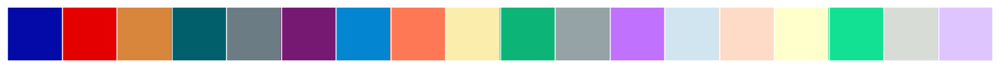

In [3]:
palette = [ "#030aa7", "#e50000", "#d8863b", "#005f6a", "#6b7c85", "#751973", 
            "#0485d1", "#ff7855", "#fbeeac", "#0cb577", "#95a3a6", "#c071fe", 
            "#d1e5f0", "#fddbc7", "#ffffcb", "#12e193", "#d8dcd6", "#dfc5fe", 
          ]
sns.palplot(sns.color_palette(palette))

In [4]:
repertoireRacine  = '.'
nomProjet         = "Iris de Fisher ou d'Anderson-CAH"

repertoireProjet  = os.path.join(repertoireRacine, nomProjet)
repertoireDonnees = os.path.join(repertoireProjet, 'repertoire.donnees')
repertoireImages  = os.path.join(repertoireProjet, 'repertoire.images')


def controleExistenceRepertoire( repertoire, create_if_needed=True):
    """Voir si le répertoire existe. S'il n'existe pas il est créé."""
    path_exists = os.path.exists(repertoire)
    if path_exists:
        if not os.path.isdir(repertoire):
            raise Exception("Trouvé le nom  "+repertoire +" mais c'est un fichier, pas un répertoire")
            # return False
        return True
    if create_if_needed:
        os.makedirs(repertoire)

def sauvegarderImage( fichier):
    """Enregistrez la figure. Appelez la méthode juste avant plt.show ()."""
    controleExistenceRepertoire(repertoireImages)
    plt.savefig(os.path.join(repertoireImages,
                             fichier+f"--{dt.now().strftime('%Y_%m_%d_%H.%M.%S')}.png"), 
                             dpi=600, 
                             bbox_inches='tight')

def sauvegarderImageSNS( sns_plot, fichier):
    """Enregistrez la figure. Appelez la méthode juste avant plt.show ()."""
    controleExistenceRepertoire(repertoireImages)
    fig = sns_plot.get_figure()
    fig.savefig(os.path.join(repertoireImages,fichier+'.png'))
    
controleExistenceRepertoire(repertoireProjet);
controleExistenceRepertoire(repertoireDonnees);
controleExistenceRepertoire(repertoireImages);

In [5]:
def formatPct(pct, allvals):
    total = int(round(pct/100. * np.sum(allvals)))
    return "{:.2f}%\n({:d})".format(pct, total)    

In [6]:
def affichageDistribution(colonne,couleur,ax, nom=''):
    graph = sns.distplot(colonne, color=couleur, ax=ax)
    graph.set(ylabel=None)
    moyenne, mediane = float(colonne.mean()), \
                   float(colonne.median())
    
    ax.axvline(moyenne, color='g', linestyle='-', label=f"{nom:12s} mean   = {moyenne:0.4f}", lw=2)
    ax.axvline(mediane, color='b', linestyle='--', label=f"{nom:12s} median = {mediane:0.4f}", lw=2)
    graph.legend(loc="upper right")

In [7]:
def afficheDendrogram(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Classification Hiérarchique Ascendante')
        plt.xlabel('Villes ou (taille du cluster)')
        plt.ylabel('Distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Lecture des données</div></b>

<table>
    <tr> 
        <th  style="text-align:left">
            <table>
                <CAPTION style='padding:15px;color:#030aa7;font-size:150%;text-align: left;font-weight: bold;font-family: Georgia, serif'>Iris.csv</CAPTION>    
            <tr>                                                                                   
                <tr>                                                                                   
                     <th  style="text-align:left;background-color:#053061;color:white;">Colonne initiale </th>
                     <th  style="text-align:left;background-color:#053061;color:white;">Description</th>
                </tr>
                <tr>
                    <th  style="text-align:left">Id</th>
                    <th  style="text-align:left">Index</th>
                </tr>
                <tr>
                    <th  style="text-align:left">SepalLengthCm</th>
                    <th  style="text-align:left">Longueur du sépale en cm</th>
                </tr>
                <tr>
                    <th  style="text-align:left">SepalWidthCm</th>
                    <th  style="text-align:left">Largeur du sépale en cm</th>
                </tr>
                <tr>
                    <th  style="text-align:left">PetalLengthCm</th>
                    <th  style="text-align:left">Longueur du pétale en cm</th>
                </tr>
                <tr>
                    <th  style="text-align:left">PetalWidthCm</th>
                    <th  style="text-align:left">Largeur du pétale en cm</th>
                </tr>
                <tr>
                    <th  style="text-align:left;color:red;">Species</th>
                    <th  style="text-align:left;color:red;">Classe d'iris : Iris Setosa, Iris Versicolour ou Iris Virginica</th>
                </tr>
            </table>
        </th>
        <th  style="text-align:left"><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/iris_description.jpg" width="1024"></th>
    </tr>
</table>

In [8]:
donnees = pd.read_csv('../donnees/Iris.csv')
donnees.Species = donnees.Species.apply(lambda x : x.replace('Iris-',''))
donnees.columns = [colonne.replace('Cm','') if colonne != 'Species' else colonne for colonne in donnees.columns]
donnees.set_index('Id',inplace=True)
donnees.head()

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
Id,,,,,
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3.0,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5.0,3.6,1.4,0.2,setosa


In [9]:
donnees.describe()

,SepalLength,SepalWidth,PetalLength,PetalWidth
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.054000,3.758667,1.198667
std,0.828066,0.433594,1.764420,0.763161
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Espèces de iris</div></b>

In [10]:
donnees.Species.sort_values().unique()

array(['setosa', 'versicolor', 'virginica'], dtype=object)

In [11]:
dict_species = {nom:i for i, nom in enumerate(donnees.Species.sort_values().unique())}
dictR_species = {i:nom for i, nom in enumerate(donnees.Species.sort_values().unique())}
dict_species,dictR_species

({'setosa': 0, 'versicolor': 1, 'virginica': 2},
 {0: 'setosa', 1: 'versicolor', 2: 'virginica'})

In [12]:
donnees.Species = donnees.Species.apply(lambda x: dict_species[x])

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Statistiques descriptives et analyse de données</div></b>

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Couleurs variables qualitatives</div></b>

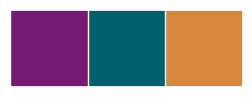

In [13]:
couleursEspece = {nom:couleur for nom,couleur in zip(donnees.Species.sort_values().unique(),["#751973","#005f6a","#d8863b"])}
couleursEspeceNom = {dictR_species[num]:couleursEspece[num] for num in couleursEspece}
sns.palplot(sns.color_palette(couleursEspece.values()))

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Statistiques  descriptives</div></b>

In [14]:
donnees.sample(5)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
Id,,,,,
147,6.3,2.5,5.0,1.9,2
80,5.7,2.6,3.5,1.0,1
67,5.6,3.0,4.5,1.5,1
34,5.5,4.2,1.4,0.2,0
46,4.8,3.0,1.4,0.3,0


In [15]:
donnees.describe().style.format("{:0.2f}") #.background_gradient(cmap=plt.get_cmap('Blues'),axis=0)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
count,150.00,150.00,150.00,150.00,150.00
mean,5.84,3.05,3.76,1.20,1.00
std,0.83,0.43,1.76,0.76,0.82
min,4.30,2.00,1.00,0.10,0.00
25%,5.10,2.80,1.60,0.30,0.00
50%,5.80,3.00,4.35,1.30,1.00
75%,6.40,3.30,5.10,1.80,2.00
max,7.90,4.40,6.90,2.50,2.00


In [16]:
donnees.columns

Index(['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth', 'Species'], dtype='object')

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Structure de l’échantillon des données </div></b>

In [17]:
donnees.sample(5)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
Id,,,,,
65,5.6,2.9,3.6,1.3,1
93,5.8,2.6,4.0,1.2,1
116,6.4,3.2,5.3,2.3,2
29,5.2,3.4,1.4,0.2,0
90,5.5,2.5,4.0,1.3,1


In [18]:
donnees.groupby(['Species']).SepalLength.count().reset_index()

,Species,SepalLength
0,0,50
1,1,50
2,2,50


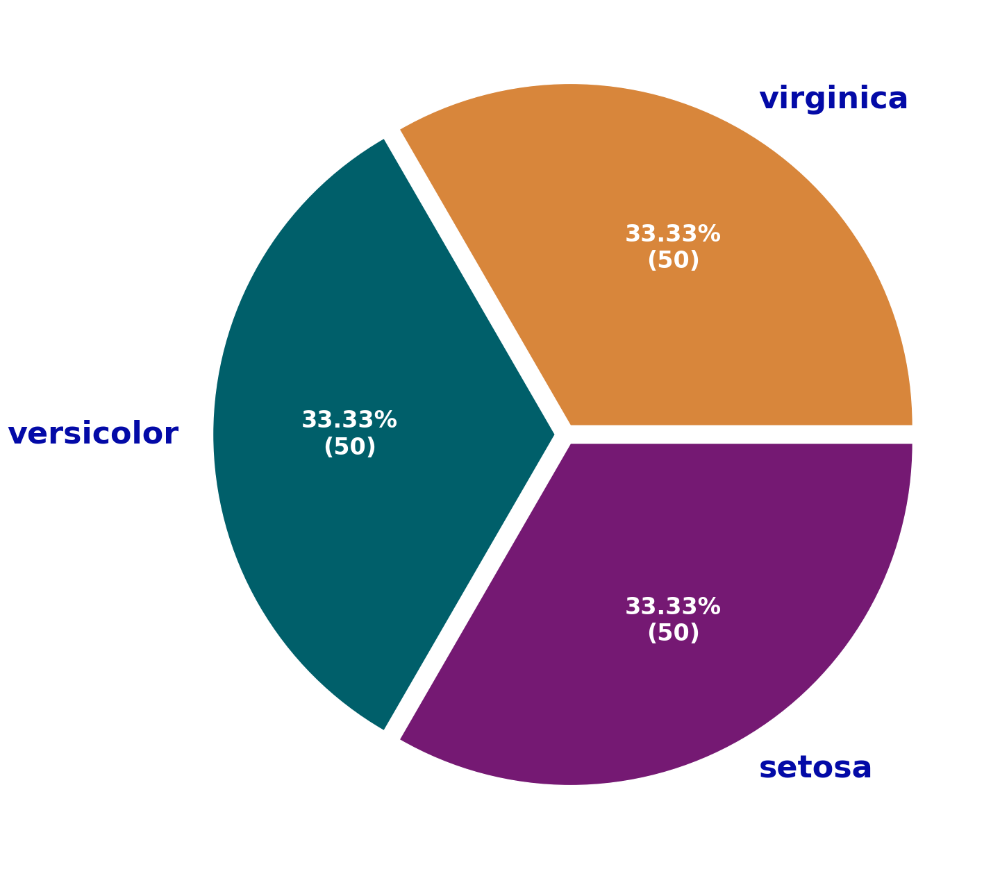

In [19]:
radius,size=0.8,0.3
fig,ax = plt.subplots(ncols=1,figsize=(16,16), subplot_kw=dict(aspect="equal"))

affichage = donnees.groupby(['Species']).SepalLength.count().reset_index().rename(columns={'SepalLength':'nombre'})
affichage['%'] = affichage.nombre * 100 / affichage.nombre.sum()
affichage

wedges, texts, autotexts =  ax.pie(
         affichage['nombre'],
         autopct=lambda pct: formatPct(pct, affichage.nombre.values),   # autopct='%1.2f%%', 
         labels=affichage['Species'].apply(lambda x : dictR_species[x]).values,
         # shadow=True, 
         counterclock=False,
         startangle=0 ,
         colors = couleursEspece.values(),
         # pctdistance=0.4, 
         labeldistance=1.1, 
         textprops=dict(color="#030aa7"),
         explode=(0.03,0.03,0.03)
      );
plt.setp(autotexts, size=24, weight="bold",color="w")
plt.setp(texts, size=32, weight="bold");

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Distribution de l’échantillon des données </div></b>

In [20]:
donnees.sample(5)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
Id,,,,,
50,5.0,3.3,1.4,0.2,0
145,6.7,3.3,5.7,2.5,2
58,4.9,2.4,3.3,1.0,1
71,5.9,3.2,4.8,1.8,1
77,6.8,2.8,4.8,1.4,1


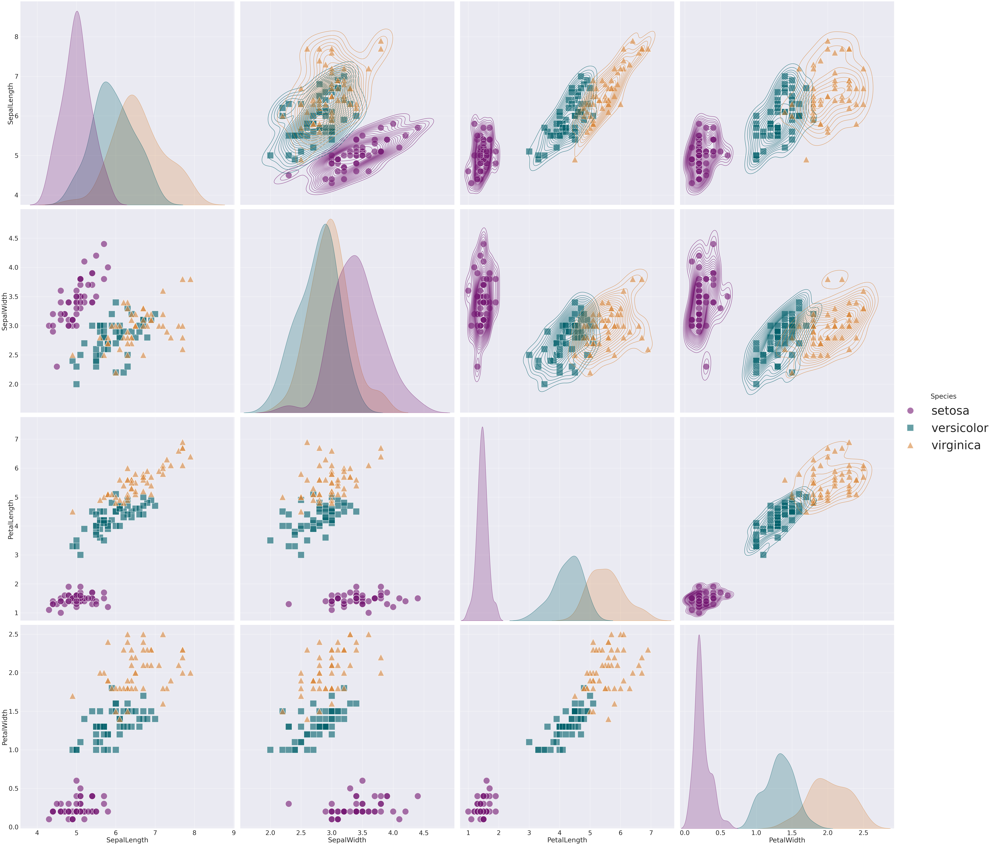

In [21]:
affichage = donnees.copy()
affichage.Species = affichage.Species.apply(lambda x : dictR_species[x])

graph = sns.pairplot(
             affichage,
             hue='Species', 
             size=16, 
             aspect=1, 
             palette=couleursEspece.values(), 
             plot_kws={"s": 1200,"alpha":0.6}, 
             markers=["o", "s", "^"],   
             # corner=True, 
             diag_kind="kde")
graph.map_upper(sns.kdeplot, levels=24, color=".2");
graph._legend.remove()
graph.add_legend(fontsize='xx-large', title_fontsize='xx-large');
del affichage
# sauvegarderImage('Iris-pairplot')

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Corrélation de Pearson</div></b>

<table>        
<tr>                                                                                   
     <th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/rmse.png" ></th>
     <th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/rse.png" ><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/correlation_pearson.png" ></th>
</tr> 
</table>
<img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/correlation_pearson_graphs.png" width="1024">

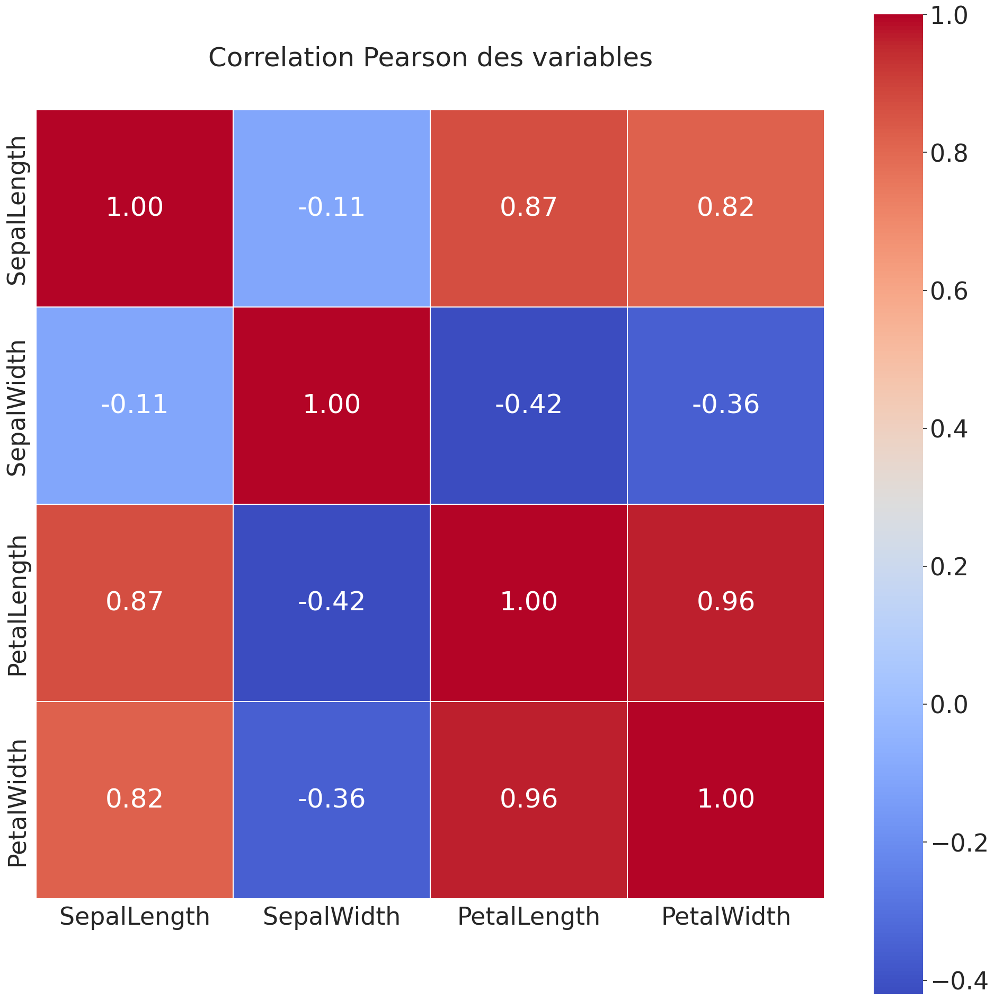

In [22]:
plt.figure(figsize=(24,24))
sns.set(font_scale=3)
plt.title('Correlation Pearson des variables', y=1.05, size=36)
sns.heatmap(donnees.drop(columns='Species').corr(),linewidths=0.3, fmt= '.2f', #vmax=1.0, 
            square=True, cmap='coolwarm', linecolor='white', annot=True)
# sauvegarderImage('Correlation Pearson des variables')   
sns.set(font_scale=2)

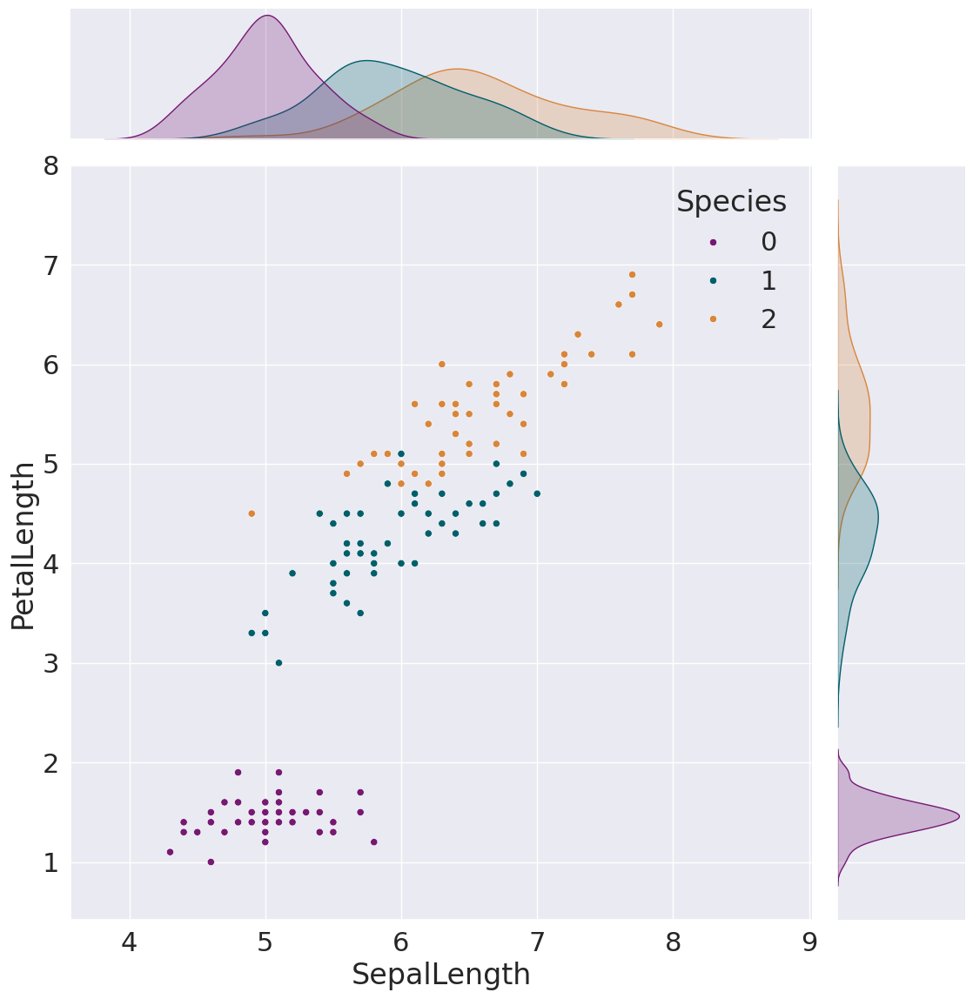

In [23]:
sns.jointplot(data=donnees, x="SepalLength", y="PetalLength",hue='Species',height=12, ratio=5, palette=list(couleursEspece.values()))
# sauvegarderImage('Correlation Pearson des variables-SepalLength-PetalLength')   

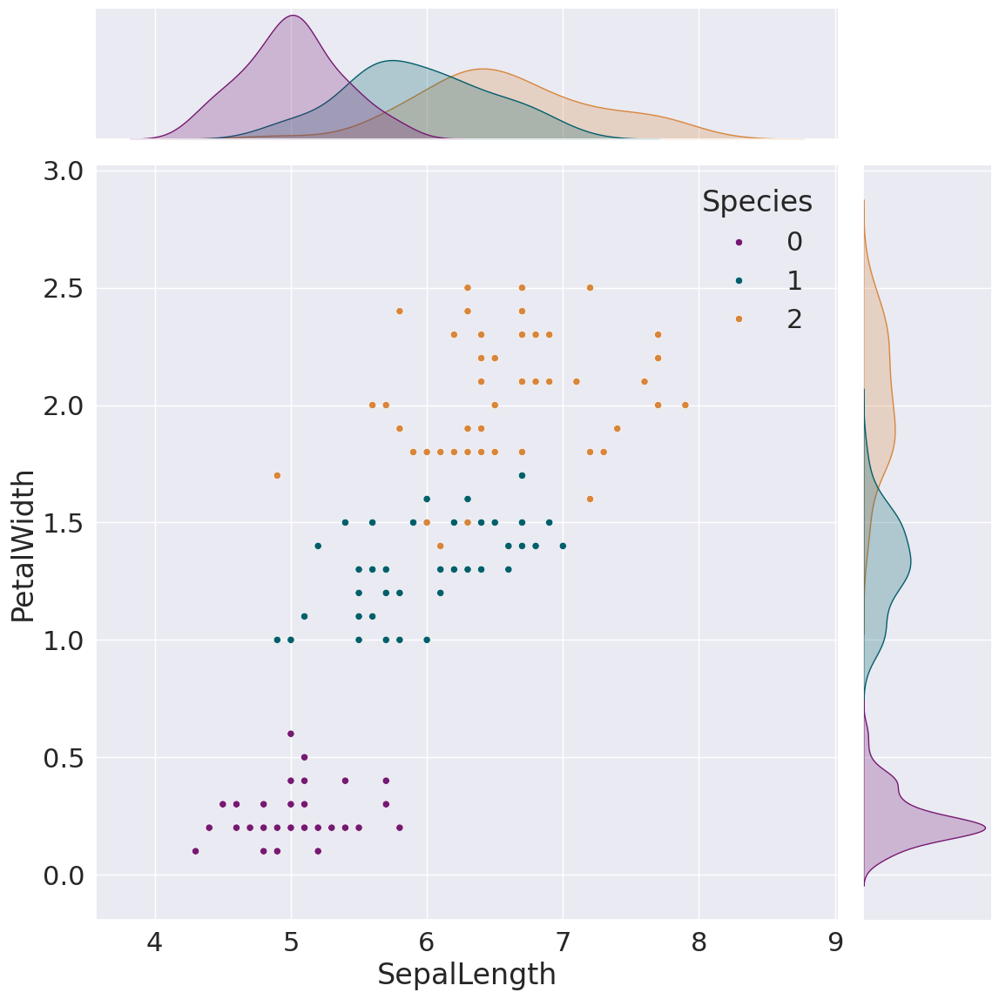

In [24]:
sns.jointplot(data=donnees, x="SepalLength", y="PetalWidth",hue='Species',height=12, ratio=5, palette=list(couleursEspece.values()))
# sauvegarderImage('Correlation Pearson des variables-SepalLength-PetalWidth')   

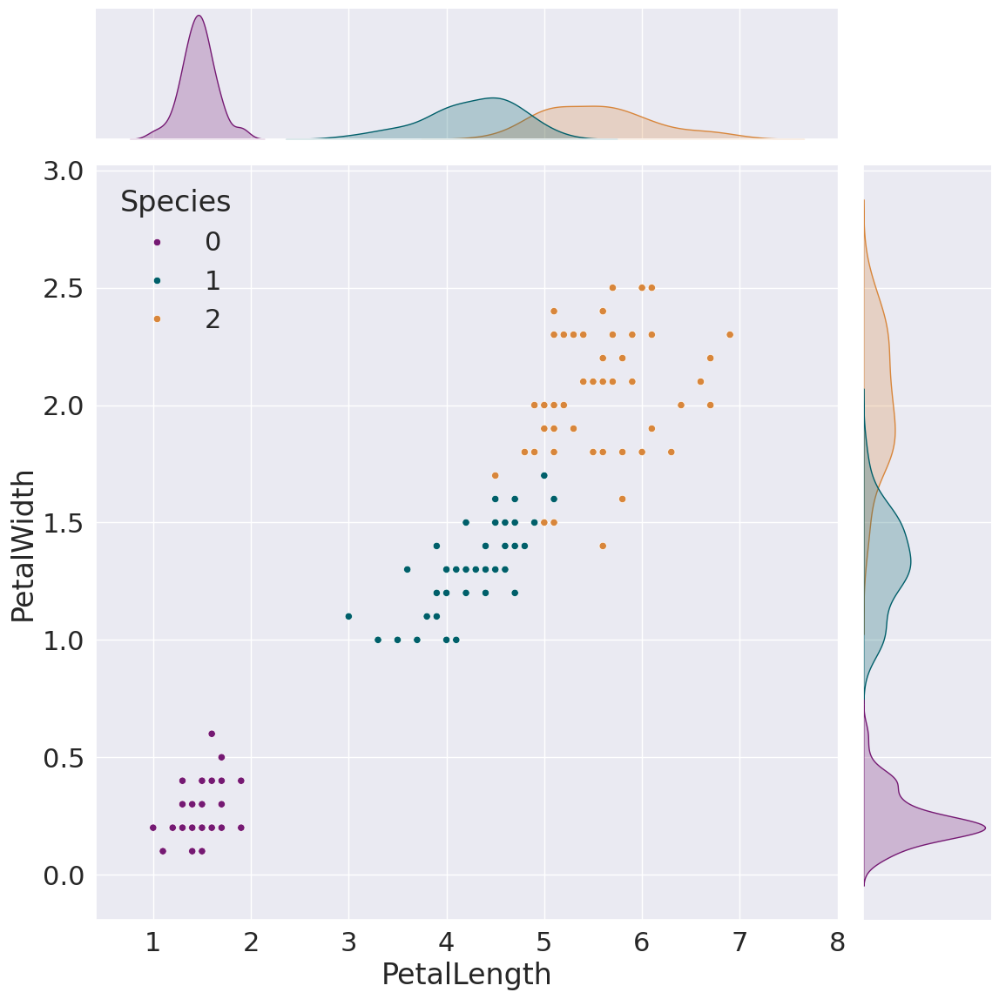

In [25]:
sns.jointplot(data=donnees, x="PetalLength", y="PetalWidth",hue='Species',height=12, ratio=5, palette=list(couleursEspece.values()))
# sauvegarderImage('Correlation Pearson des variables-PetalLength-PetalWidth')   

### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Distribution des variables</div></b>

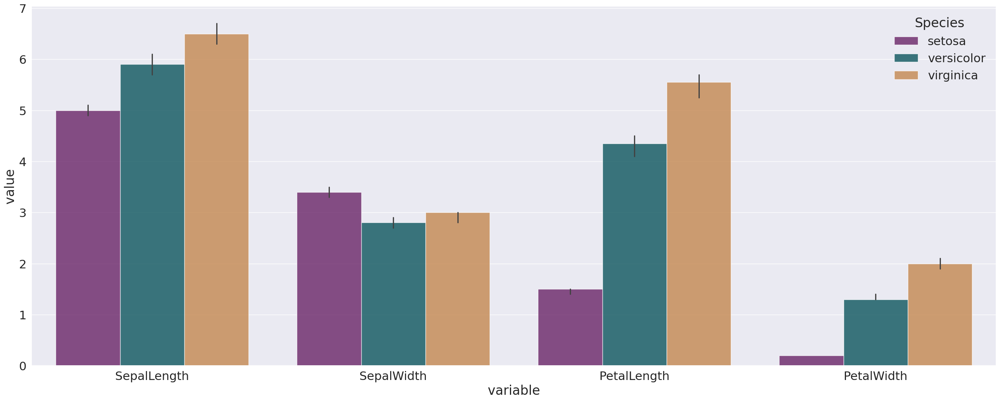

In [26]:
affichage = donnees.copy()
affichage.Species = affichage.Species.apply(lambda x : dictR_species[x])
affichage = affichage.melt(id_vars=['Species'], value_vars=['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth'])

plt.figure(figsize=(32,12))
gbarplot = sns.barplot(x='variable',y='value',hue='Species', data=affichage,palette=couleursEspece.values(),alpha=0.8,estimator='median')
# sauvegarderImage('Moyenne des variables initiales par espèce-barplot')   

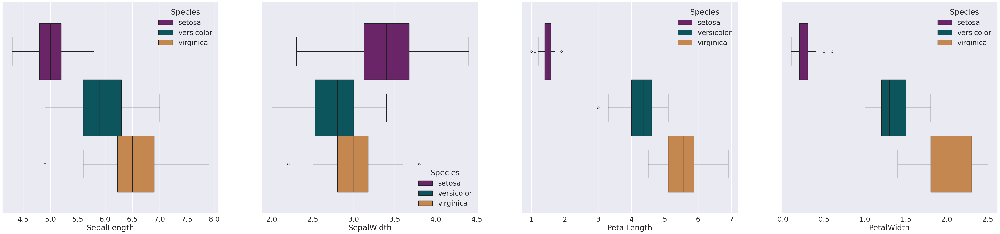

In [27]:
affichage = donnees.copy()
affichage.Species = affichage.Species.apply(lambda x : dictR_species[x])

fig,ax = plt.subplots(1,4,figsize=(56,12));

for i,colonne in enumerate(affichage.columns[:-1]):
    sns.boxplot(x=colonne,data=affichage,hue='Species', palette=couleursEspece.values(), ax=ax[i]);
    
# sauvegarderImage('Distribution des variables initiales par espèce-boxplot')       

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Centrage et réduction des données</div></b>
<table>
<tr>
<th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/moyenne.png"></th>
<th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/ecart_type.png"></th>
<th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/centrage_reduction.png"></th>
</tr>
</table>

In [28]:
donneesR = donnees.copy()

In [29]:
modelStd = StandardScaler()
modelStd.fit(donnees.drop(columns='Species'))

donnees[donnees.drop(columns='Species').columns] = modelStd.transform(donnees.drop(columns='Species'))
donnees.drop(columns='Species').head()

,SepalLength,SepalWidth,PetalLength,PetalWidth
Id,,,,
1,-0.900681,1.032057,-1.341272,-1.312977
2,-1.143017,-0.124958,-1.341272,-1.312977
3,-1.385353,0.337848,-1.398138,-1.312977
4,-1.506521,0.106445,-1.284407,-1.312977
5,-1.021849,1.263460,-1.341272,-1.312977


### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Distribution variables quantitatives</div></b>

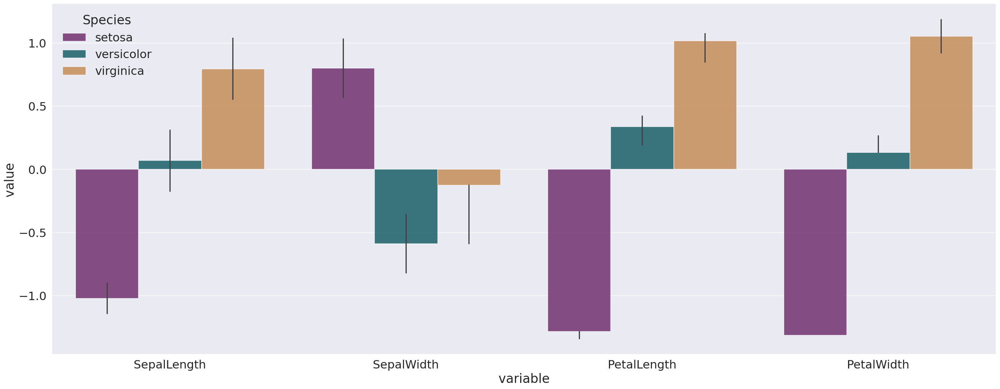

In [30]:
affichage = donnees.copy()
affichage.Species = affichage.Species.apply(lambda x : dictR_species[x])
affichage = affichage.melt(id_vars=['Species'], value_vars=['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth'])

plt.figure(figsize=(32,12))
gbarplot = sns.barplot(x='variable',y='value',hue='Species', data=affichage,palette=couleursEspece.values(),alpha=0.8,estimator='median')
# sauvegarderImage('Moyenne des variables centrées et réduites par espèce-barplot') 

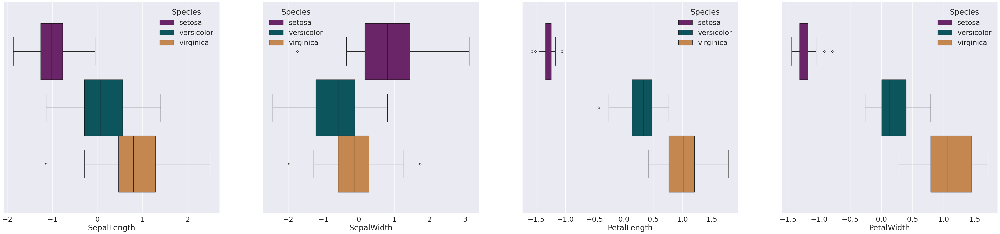

In [31]:
affichage = donnees.copy()
affichage.Species = affichage.Species.apply(lambda x : dictR_species[x])

fig,ax = plt.subplots(1,4,figsize=(56,12));

for i,colonne in enumerate(affichage.columns[:-1]):
    sns.boxplot(x=colonne,data=affichage,hue='Species', palette=couleursEspece.values(), ax=ax[i]);

# sauvegarderImage('Distribution des variables centrées et réduites par espèce-boxplot')      

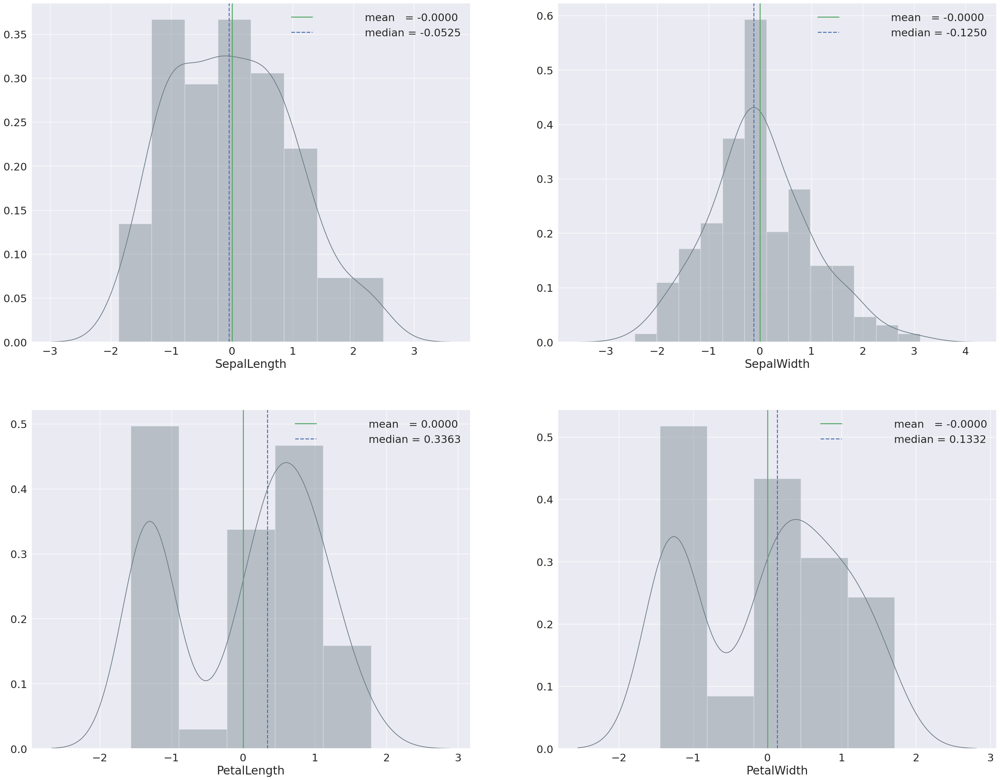

In [32]:
fig, axes = plt.subplots(2,2, figsize=(36,28));
for ax,colonne in zip(axes.ravel(),affichage.columns[:-1]):
    affichageDistribution(affichage[colonne],"#6b7c85",ax)
# sauvegarderImage('Distribution Variables Quantitatives')

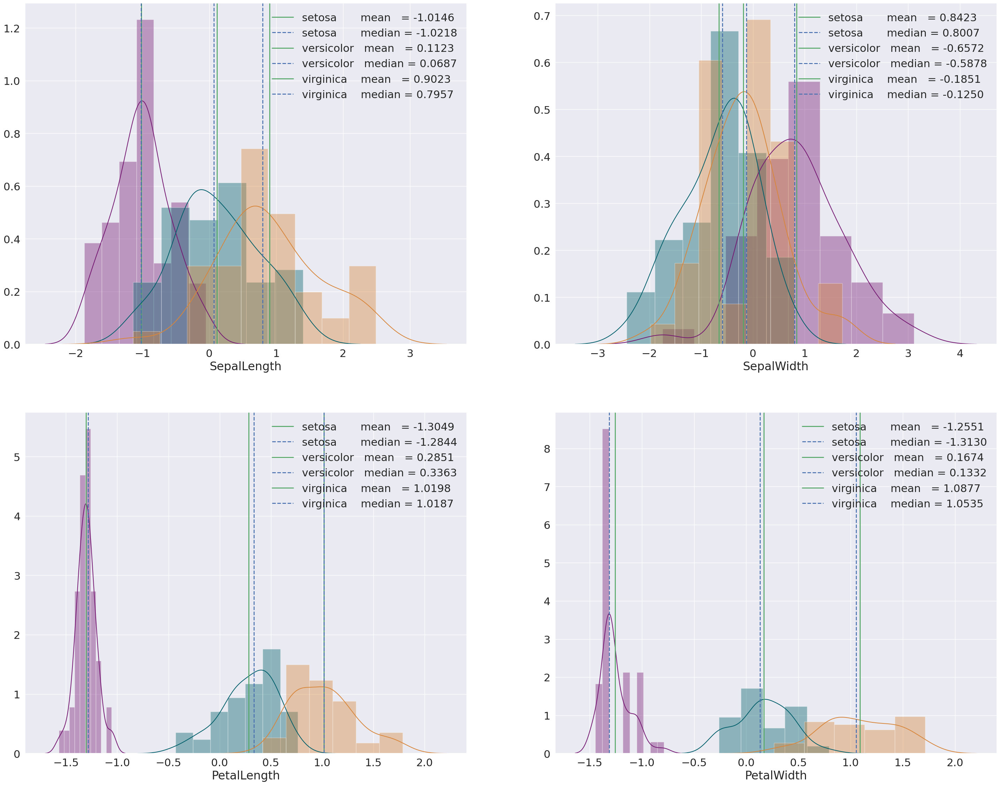

In [33]:
fig, axes = plt.subplots(2,2, figsize=(36,28));
for ax,colonne in zip(axes.ravel(),affichage.columns[:-1]):
    affichageDistribution(affichage.loc[affichage.Species == 'setosa',colonne],'#751973',ax,nom='setosa')
    affichageDistribution(affichage.loc[affichage.Species == 'versicolor',colonne],'#005f6a',ax,nom='versicolor')
    affichageDistribution(affichage.loc[affichage.Species == 'virginica',colonne],'#d8863b',ax,nom='virginica') 
# sauvegarderImage('Distribution Variables Quantitatives-par espèce')

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Classification hiérarchique ascendante</div></b>

In [34]:
donnees.sample(5)

,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
Id,,,,,
62,0.068662,-0.124958,0.250967,0.396172,1
116,0.674501,0.337848,0.876490,1.447956,2
72,0.310998,-0.587764,0.137236,0.133226,1
42,-1.627688,-1.744778,-1.398138,-1.181504,0
123,2.249683,-0.587764,1.672610,1.053537,2


In [35]:
Species = donnees['Species'].apply(lambda x : dictR_species[x]).values
donnees.set_index(['Species'], inplace=True)
Z = linkage(donnees, 'ward')

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Affichage des arbres par défaut</div></b>

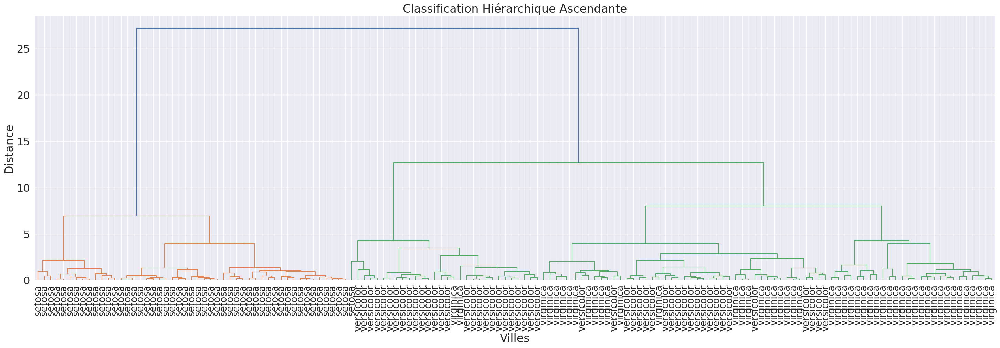

In [36]:
plt.figure(figsize=(36, 10))
plt.title('Classification Hiérarchique Ascendante')
plt.xlabel('Villes')
plt.ylabel('Distance')
dendrogram(Z,
           leaf_rotation=90.,
           leaf_font_size=20.,
           labels = Species);

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Affichage des arbres 3 clases</div></b>

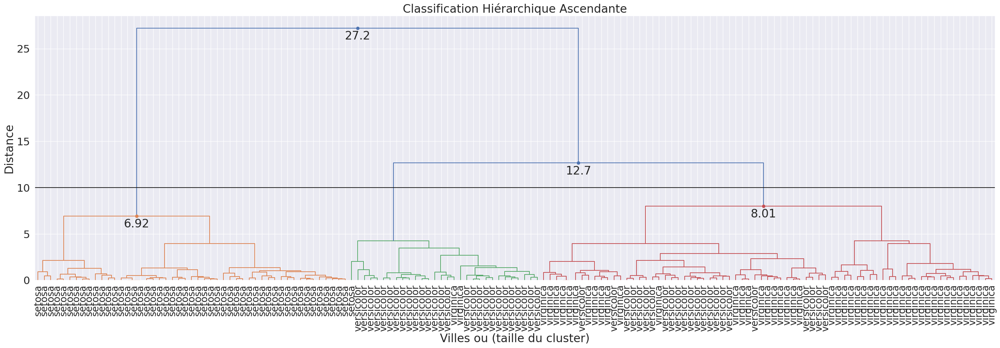

In [37]:
plt.figure(figsize=(36, 10))
afficheDendrogram(
    Z,
    truncate_mode='lastp',
    p=150,                          # nombres des classes
    leaf_rotation=90.,
    leaf_font_size=20.,
    show_contracted=True,
    annotate_above=5,             # les annotations à partir de cette distance
    max_d=10,                      # la distance de découpage de l’arbre
    labels = Species
);

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Affichage des arbres 2 clases</div></b>

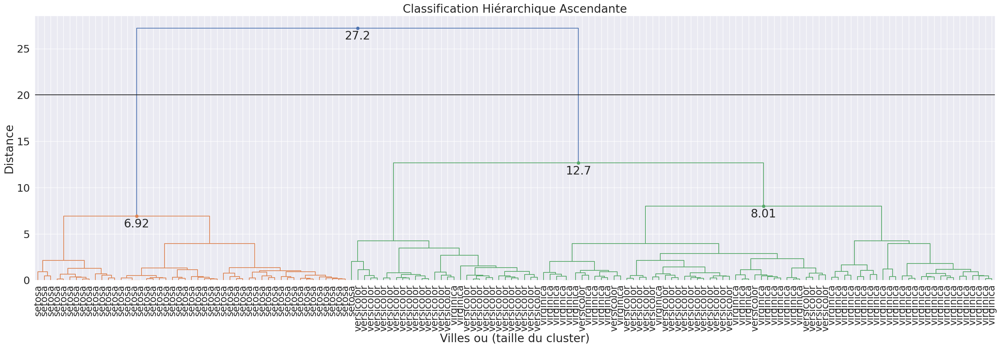

In [38]:
plt.figure(figsize=(36, 10))
afficheDendrogram(
    Z,
    truncate_mode='lastp',
    p=150,                          # nombres des classes
    leaf_rotation=90.,
    leaf_font_size=20.,
    show_contracted=True,
    annotate_above=5,             # les annotations à partir de cette distance
    max_d=20,                      # la distance de découpage de l’arbre
    labels = Species
);

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Prédiction des classes</div></b>

In [39]:
donnees['Classes2' ]=fcluster(Z, t=20, criterion='distance')
donnees['Classes3']=fcluster(Z, t=10, criterion='distance')
donnees['Classes2']=donnees['Classes2'].astype('object')
donnees['Classes3' ]=donnees['Classes3' ].astype('object')

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Silhouette</div></b>
<img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/clustering/silhouette.png" width="512">

In [40]:
print(f"""
 2 classes -> silhuette = {silhouette_score(donnees[['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth']],donnees.Classes2):0.2f}
 3 classes -> silhuette = {silhouette_score(donnees[['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth']],donnees.Classes3):0.2f}
""")


 2 classes -> silhuette = 0.58
 3 classes -> silhuette = 0.45



In [41]:
affichage = donnees.reset_index()
pd.crosstab(affichage['Classes3'],affichage['Species'].apply(lambda x : dictR_species[x]).values).style.format("{:d}").background_gradient(cmap=plt.get_cmap('Blues'),axis=0)

col_0,setosa,versicolor,virginica
Classes3,,,
1,49,0,0
2,1,27,2
3,0,23,48


In [42]:
print(f'Performance de l’algorithme : {(1 - 25/150)*100:0.2f}%' )

Performance de l’algorithme : 83.33%


## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Affichage des clusters</div></b>

In [43]:
layout = go.Layout({"showlegend": False})
affichage = donnees.reset_index()
# affichage['Species'] = affichage['Species'].apply(lambda x : dictR_species[x]).values

fig = px.scatter_3d(affichage.sort_values('Classes2'), 
                    x='SepalLength', 
                    y='PetalLength', 
                    z='PetalWidth',
                    color='Classes2',
                    # size= 'Classes4',
                    symbol='Species',
                    text='Species',
                    width=1024,
                    height=1024,
                   )

fig.show()

In [44]:
layout = go.Layout({"showlegend": False})
affichage = donnees.reset_index()
# affichage['Species'] = affichage['Species'].apply(lambda x : dictR_species[x]).values

fig = px.scatter_3d(affichage.sort_values('Classes3'), 
                    x='SepalLength', 
                    y='PetalLength', 
                    z='PetalWidth',
                    color='Classes3',
                    # size= 'Classes4',
                    symbol='Species',
                    text='Species',
                    width=1024,
                    height=1024,
                   )

fig.show()

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Analyse en composantes principales</div></b>

<table>
<tr>
<th><div style='padding:15px;color:#030aa7;font-size:120%;text-align: center;font-family: Georgia, serif'>Quelle est la meilleure représentation simplifiée ?</div></th>
<th><div style='padding:15px;color:#030aa7;font-size:120%;text-align: center;font-family: Georgia, serif'>Recherche du meilleur axe de projection</div></th>
</tr>    
<tr>
<th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/acp_analogie_photo.png" width="512"></th>
<th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/acp_projection_axe.png" width="512"></th>
</tr>
</table>    
<div style='padding:15px;color:#030aa7;font-size:120%;text-align: left;font-family: Georgia, serif'>A l'évidence, c'est la vue de profil. La raison est que l'image projetée du chameau dans ce plan est plus proche de l'image initiale dans le sens ou la variance des points servant à sa représentation est plus grande et donc restitue mieux la variance des points d'origine.</div>
<table>
<tr>
<th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/axe_variance_max.png"></th>
<th><img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/max_dist.png"></th>
</tr>
</table>

In [45]:
modelPCA = PCA(svd_solver='full')
modelPCA.fit(donnees[['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth']])

,n_components,None
,copy,True
,whiten,False
,svd_solver,'full'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Transformation des données 3 dimensions</div></b>

In [46]:
modelPCA = PCA(n_components=3).set_output(transform="pandas")
donneesACP = modelPCA.fit_transform(donnees[['SepalLength', 'SepalWidth', 'PetalLength', 'PetalWidth']])
donneesACP.columns = [f'Dimension{i:02d}' for i in range(1,4)]

#### <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Représentation des individus</div></b>

In [47]:
layout = go.Layout({"showlegend": False})

fig = px.scatter_3d(donneesACP.reset_index(), 
                    x='Dimension01', 
                    y='Dimension02', 
                    z='Dimension03',
                    color='Species', 
                    size=(donneesACP.Dimension03 - donneesACP.Dimension03.min()),
                    symbol='Species', 
                    text='Species',
                    width=1024,
                    height=1024,
                   )

fig.show()

# <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Classification hiérarchique ascendante</div></b>

In [48]:
donneesACP.sample(5)

,Dimension01,Dimension02,Dimension03
Species,,,
1,1.072594,-0.211758,0.397447
1,0.926222,0.030331,0.595460
0,-2.168194,0.552016,0.201295
0,-2.202750,1.513750,0.001363
0,-2.086426,-0.655405,0.227251


In [49]:
Species = donneesACP.reset_index()['Species'].apply(lambda x : dictR_species[x]).values
Z = linkage(donneesACP, 'ward')

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Affichage des arbres par défaut</div></b>

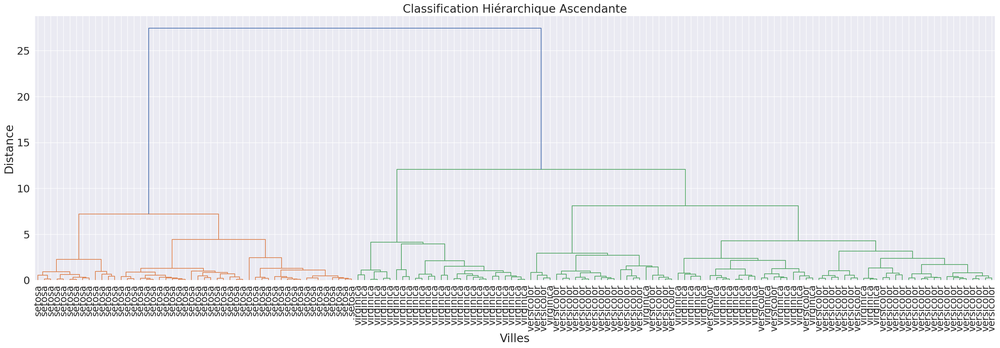

In [50]:
plt.figure(figsize=(36, 10))
plt.title('Classification Hiérarchique Ascendante')
plt.xlabel('Villes')
plt.ylabel('Distance')
dendrogram(Z,
           leaf_rotation=90.,
           leaf_font_size=20.,
           labels = Species);

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Affichage des arbres 3 clases</div></b>

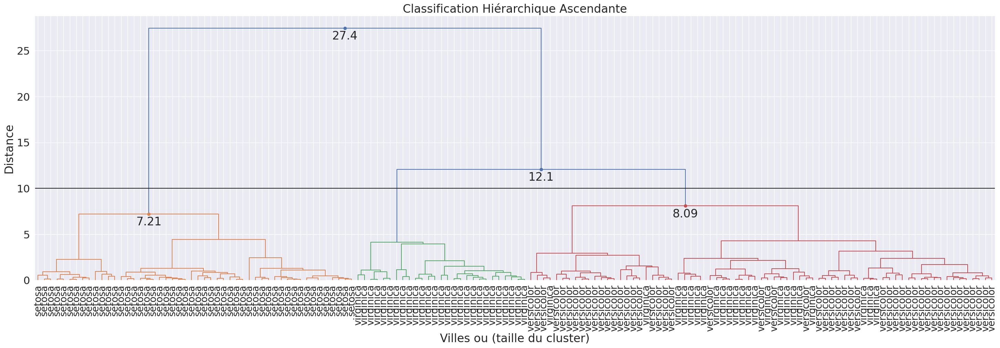

In [51]:
plt.figure(figsize=(36, 10))
afficheDendrogram(
    Z,
    truncate_mode='lastp',
    p=150,                          # nombres des classes
    leaf_rotation=90.,
    leaf_font_size=20.,
    show_contracted=True,
    annotate_above=5,             # les annotations à partir de cette distance
    max_d=10,                      # la distance de découpage de l’arbre
    labels = Species
);

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Affichage des arbres 2 clases</div></b>

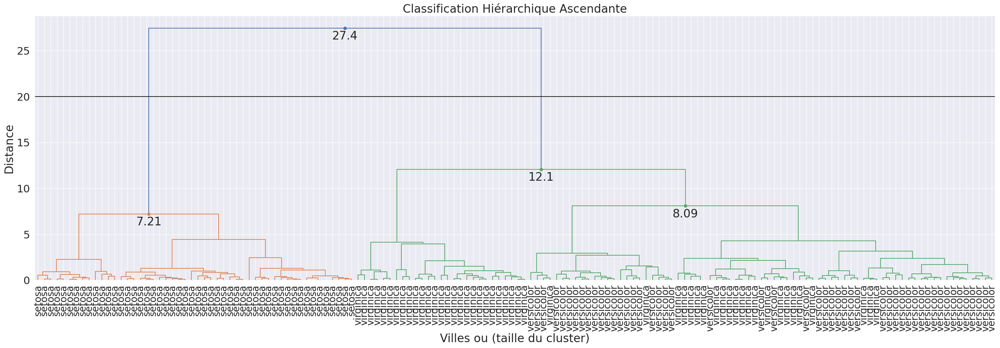

In [52]:
plt.figure(figsize=(36, 10))
afficheDendrogram(
    Z,
    truncate_mode='lastp',
    p=150,                          # nombres des classes
    leaf_rotation=90.,
    leaf_font_size=20.,
    show_contracted=True,
    annotate_above=5,             # les annotations à partir de cette distance
    max_d=20,                      # la distance de découpage de l’arbre
    labels = Species
);

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Prédiction des classes</div></b>

In [53]:
donneesACP['Classes2' ]=fcluster(Z, t=20, criterion='distance')
donneesACP['Classes3']=fcluster(Z, t=10, criterion='distance')
donneesACP['Classes2']=donneesACP['Classes2'].astype('object')
donneesACP['Classes3' ]=donneesACP['Classes3' ].astype('object')

## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Silhouette</div></b>
<img src="https://raw.githubusercontent.com/rbizoi/MachineLearning/refs/heads/master/images/clustering/silhouette.png" width="512">

In [54]:
print(f"""
 2 classes -> silhuette = {silhouette_score(donneesACP,donneesACP.Classes2):0.2f}
 3 classes -> silhuette = {silhouette_score(donneesACP,donneesACP.Classes3):0.2f}
""")


 2 classes -> silhuette = 0.63
 3 classes -> silhuette = 0.54



In [55]:
affichage = donneesACP.reset_index()
affichage['Species'] = affichage['Species'].apply(lambda x : dictR_species[x])
pd.crosstab(affichage['Classes3'],affichage['Species']).style.format("{:d}").background_gradient(cmap=plt.get_cmap('Blues'),axis=0)

Species,setosa,versicolor,virginica
Classes3,,,
1,50,0,0
2,0,0,27
3,0,50,23


In [56]:
affichage.loc[affichage['Classes3'] == 2,'Classes3'] = 4
affichage.loc[affichage['Classes3'] == 3,'Classes3'] = 2
affichage.loc[affichage['Classes3'] == 4,'Classes3'] = 3

In [57]:
pd.crosstab(affichage['Classes3'],affichage['Species']).style.format("{:d}").background_gradient(cmap=plt.get_cmap('Blues'),axis=0)

Species,setosa,versicolor,virginica
Classes3,,,
1,50,0,0
2,0,50,23
3,0,0,27


In [58]:
print(f'Performance de l’algorithme : {(1 - 23/150)*100:0.2f}%' )

Performance de l’algorithme : 84.67%


## <b><div style='padding:15px;background-color:#d8dcd6;color:#030aa7;font-size:120%;text-align: left'>Affichage des clusters</div></b>

In [59]:
layout = go.Layout({"showlegend": False})
affichage = donnees.reset_index()
# affichage['Species'] = affichage['Species'].apply(lambda x : dictR_species[x]).values

fig = px.scatter_3d(affichage.sort_values('Classes3'), 
                    x='SepalLength', 
                    y='PetalLength', 
                    z='PetalWidth',
                    color='Classes3',
                    # size= 'Classes4',
                    symbol='Species',
                    text='Species',
                    width=1024,
                    height=1024,
                   )

fig.show()